In [1]:
VERSION = 144
DATASET_VERSION = f'EE_DATASET_{VERSION}'
TRAIN_VERSION_0 = f'EE_TRAIN_{VERSION}_0'
TRAIN_VERSION_1 = f'EE_TRAIN_{VERSION}_1'
TRAIN_VERSION_2 = f'EE_TRAIN_{VERSION}_2'
PATH = 'data'

In [2]:
import polars as pl
import pandas as pd
import numpy as np
import os
import pickle
import treelite
from datetime import datetime

pl.Config.set_tbl_rows(101)
pd.set_option("display.max_columns", 50)
pd.set_option("display.max_rows", 101)

%load_ext memory_profiler

In [3]:
N_FOLDS = 12

In [4]:
dataset_path = os.path.join(PATH, 'dataset', DATASET_VERSION)
print(dataset_path)
train_path_0 = os.path.join(PATH, 'model', TRAIN_VERSION_0)
print(train_path_0)
train_path_1 = os.path.join(PATH, 'model', TRAIN_VERSION_1)
print(train_path_1)
train_path_2 = os.path.join(PATH, 'model', TRAIN_VERSION_2)
print(train_path_2)

data\dataset\EE_DATASET_144
data\model\EE_TRAIN_144_0
data\model\EE_TRAIN_144_1
data\model\EE_TRAIN_144_2


In [5]:
def pkl_save(obj, path, file_name):
    f_name = os.path.join(path, f'{file_name}.pkl')
    with open(f_name, 'wb') as file:
        pickle.dump(obj, file)

def pkl_load(path, file_name):
    f_name = os.path.join(path, f'{file_name}.pkl')
    obj = pickle.load(open(f_name, 'rb'))

    return obj

In [6]:
mean_std = pkl_load(dataset_path, 'power_log1p')

COLUMNS_X_CAT = pkl_load(dataset_path, 'COLUMNS_X_CAT')
COLUMNS_X_NUM_0 = pkl_load(dataset_path, 'COLUMNS_X_NUM_0')
COLUMNS_X_NUM_1 = pkl_load(dataset_path, 'COLUMNS_X_NUM_1')
COLUMNS_X_NUM_2 = pkl_load(dataset_path, 'COLUMNS_X_NUM_2')
COLUMNS_X_0 = list(COLUMNS_X_CAT) + COLUMNS_X_NUM_0
COLUMNS_X_1 = list(COLUMNS_X_CAT) + COLUMNS_X_NUM_1
COLUMNS_X_2 = list(COLUMNS_X_CAT) + COLUMNS_X_NUM_2
COLUMNS_Y = pkl_load(dataset_path, 'COLUMNS_Y')

In [7]:
class Model():
    def __init__(self, model_type, inference, path):
        self.inference = inference
        if inference == False:
            self.models = self.build(model_type, path)
        elif inference == True:
            self.models = self.build_inference(model_type, path)
        
    def build(self, model_type, path):
        models = {}

        for b in range(1, 101):
            models[f'b{b}'] = {}
            for f in range(N_FOLDS):
                suffix = f'b{b}f{f}'
                if model_type == 'xgb':
                    f_name = os.path.join(path, f'xgb_{suffix}.xgb')
                    try:
                        models[f'b{b}'][f'f{f}'] = treelite.Model.load(f_name, model_format='xgboost')
                    except:
                        print(f'skipped: b{b}f{f}')
                        continue
        
        return models

    def build_inference(self, model_type, path):
        models = {}

        for b in range(1, 101):
            models[f'b{b}'] = {}
            suffix = f'b{b}_inference'
            if model_type == 'xgb':
                f_name = os.path.join(path, f'xgb_{suffix}.xgb')
                models[f'b{b}'] = treelite.Model.load(f_name, model_format='xgboost')
        
        return models
    
    def predict(self, b, x):
        if self.inference == False:
            tree_models = self.models[f'b{b}']
            preds = []
            
            for f in range(N_FOLDS):
                try:
                    pred = treelite.gtil.predict(tree_models[f'f{f}'], data=x)
                    preds.append(pred)
                except:
                    #print(f'skipped: b{b}f{f}')
                    continue
                
            return np.mean(preds)
    
        elif self.inference == True:
            
            return np.mean(treelite.gtil.predict(self.models[f'b{b}'], data=x))

In [8]:
models_0 = Model('xgb', True, train_path_0)
models_1 = Model('xgb', True, train_path_1)
models_2 = Model('xgb', True, train_path_2)

In [9]:
print('models_0:', COLUMNS_X_0)
print('models_1:', COLUMNS_X_1)
print('models_2:', COLUMNS_X_2)

models_0: ['whc', 'sin_hour', 'cos_hour', 'temperature_squared', 'temperature_squared_mean', 'THI', 'THI_mean', 'humidity_squared', 'power_log1p_stdd_mean', 'power_log1p_stdd_shift', 'power_log1p_stdd_cumweek_mean_shift', 'power_log1p_stdd_thisweek_mean_shift']
models_1: ['whc', 'sin_hour', 'cos_hour', 'temperature_squared', 'temperature_squared_mean', 'THI', 'THI_mean', 'humidity_squared', 'power_log1p_stdd_mean', 'power_log1p_stdd_shift', 'power_log1p_stdd_cumweek_mean_shift']
models_2: ['whc', 'sin_hour', 'cos_hour', 'temperature_squared', 'temperature_squared_mean', 'THI', 'THI_mean', 'humidity_squared', 'power_log1p_stdd_mean', 'power_log1p_stdd_shift']


In [10]:
def create_predict(df, columns, models):
    submission = []
    for feat in df[['num_date_time', 'building'] + columns].rows():
        i = feat[0]
        b = feat[1]
        w = feat[2]
        whc = np.eye(5)[np.array([w])]
        num = np.array([feat[3:]])
        x = np.concatenate([whc, num], axis=1).astype(np.float32)
        pred = np.expm1(models.predict(b, x) * mean_std[b]['std'] + mean_std[b]['mean'])
        submission.append({'num_date_time': i, 'answer': pred})
    return submission

### Ver1.
Public Score : 5.2707265718<br>
Private Score: 6.1053683645

In [11]:
test = pl.read_csv(f'{dataset_path}/test.csv').sort(['building', 'date', 'hour'])
test = test.with_columns(pl.col('date').str.to_date())

submission_0 = create_predict(test.filter((test['power_log1p_stdd_thisweek_mean_shift']!=-9999) & (test['date']<datetime(2022, 8, 27))), COLUMNS_X_0, models_0)
submission_1 = create_predict(test.filter((test['power_log1p_stdd_thisweek_mean_shift']==-9999) & (test['date']<datetime(2022, 8, 27))), COLUMNS_X_1, models_1)
submission_2 = create_predict(test.filter(test['date']>=datetime(2022, 8, 27)), COLUMNS_X_2, models_2)
submission = submission_0 + submission_1 + submission_2

submission = pl.DataFrame(submission)
submission[['num_date_time', 'answer']].write_csv(f'{PATH}/submission_{DATASET_VERSION}_1.csv')
print(submission['answer'].mean())
print((submission['answer']>25000).sum())

test_1 = test.join(submission, on='num_date_time')

2327.985298015829
0


### Ver2.
Public Score : 5.2786695632<br>Private Score: 
6.1087725037

In [12]:
test = pl.read_csv(f'{dataset_path}/test.csv').sort(['building', 'date', 'hour'])
test = test.with_columns(pl.col('date').str.to_date())

submission_1 = create_predict(test.filter(test['date']<datetime(2022, 8, 27)), COLUMNS_X_1, models_1)
submission_2 = create_predict(test.filter(test['date']>=datetime(2022, 8, 27)), COLUMNS_X_2, models_2)
submission = submission_1 + submission_2

submission = pl.DataFrame(submission)
submission[['num_date_time', 'answer']].write_csv(f'{PATH}/submission_{DATASET_VERSION}_2.csv')
print(submission['answer'].mean())
print((submission['answer']>25000).sum())

test_2 = test.join(submission, on='num_date_time')

2326.609969592809
0


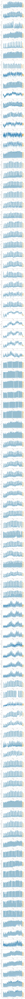

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

train = pl.read_csv(f'{dataset_path}/train.csv').sort(['building', 'date', 'hour'])

fig, axs = plt.subplots(nrows=100, ncols=1, figsize=(10, 400), constrained_layout=True)
for b in range(1, 101):
    ax = axs[b-1]
    train_data = train.filter(train['building']==b).to_pandas()
    test_data_1 = test_1.filter(test_1['building']==b).to_pandas()
    test_data_2 = test_2.filter(test_2['building']==b).to_pandas()
    _ = sns.lineplot(data=train_data, x='index', y='power', estimator='mean', errorbar=None, ax=ax)
    _ = sns.lineplot(data=test_data_1, x='index', y='answer', estimator='mean', color='red', errorbar=None, size=0.1, legend=False, ax=ax)
    _ = sns.lineplot(data=test_data_2, x='index', y='answer', estimator='mean', color='orange', errorbar=None, size=0.1, legend=False, ax=ax)
    _ = ax.set_title(b)